# Import packages

In [8]:
import os
import pickle
import pandas as pd

# Make automatically EDA
from ydata_profiling import ProfileReport

from src import dataset, features, plots
from src.modeling import train

# Load environment variables from .env file
from dotenv import load_dotenv
load_dotenv()

True

# Load environment variables

In [9]:
ROOT_DIR = os.getenv("ROOT_DIR")
DATA_RAW_DIR_PATH = os.path.join(ROOT_DIR, "data/raw/")
DATA_PROCESSED_DIR_PATH = os.path.join(ROOT_DIR, "data/processed/")
DATA_INTERIM_DIR_PATH = os.path.join(ROOT_DIR, "data/interim/")
CLICKS_DIR_PATH = os.path.join(ROOT_DIR, "data/raw/clicks/")
MODEL_DIR_PATH = os.path.join(ROOT_DIR, "models/")

# Preprocess

In [3]:
# Concat csv file clicks into clicks_hour
concated_csv_files_df = dataset.concat_csv_files(
    CLICKS_DIR_PATH, os.path.join(DATA_INTERIM_DIR_PATH, "clicks_hour.csv")
)

In [10]:
# Load the CSV file
clicks_hour_df = pd.read_csv(os.path.join(DATA_INTERIM_DIR_PATH, "clicks_hour.csv"))

# Print the first five lines
clicks_hour_df.head()

,user_id,session_id,session_start,session_size,click_article_id,click_timestamp,click_environment,click_deviceGroup,click_os,click_country,click_region,click_referrer_type
0,125902,1507646181164436,1507646181000,3,300082,1507646205390,4,1,17,1,25,1
1,125902,1507646181164436,1507646181000,3,157339,1507646240678,4,1,17,1,25,1
2,125902,1507646181164436,1507646181000,3,314424,1507646270678,4,1,17,1,25,1
3,7237,1507646181834437,1507646181000,2,156964,1507646316386,4,1,17,1,21,2
4,7237,1507646181834437,1507646181000,2,64409,1507646346386,4,1,17,1,21,2


In [6]:
# Merge csv file
merged_csv_files_df = dataset.merge_csv_files(
    os.path.join(DATA_INTERIM_DIR_PATH, "clicks_hour.csv"),
    os.path.join(DATA_RAW_DIR_PATH, "articles_metadata.csv"),
    os.path.join(DATA_INTERIM_DIR_PATH, "merged_data.csv")
)

In [11]:
# Load the CSV file
merged_data_df = pd.read_csv(os.path.join(DATA_INTERIM_DIR_PATH, "merged_data.csv"))

# Print the first five lines
merged_data_df.head()

,user_id,session_id,session_start,session_size,click_timestamp,click_environment,click_deviceGroup,click_os,click_country,click_region,click_referrer_type,article_id,category_id,created_at_ts,publisher_id,words_count
0,125902,1507646181164436,1507646181000,3,1507646205390,4,1,17,1,25,1,300082,428,1507617911000,0,285
1,125902,1507646181164436,1507646181000,3,1507646240678,4,1,17,1,25,1,157339,281,1507567573000,0,184
2,125902,1507646181164436,1507646181000,3,1507646270678,4,1,17,1,25,1,314424,431,1507623205000,0,236
3,7237,1507646181834437,1507646181000,2,1507646316386,4,1,17,1,21,2,156964,281,1507627439000,0,135
4,7237,1507646181834437,1507646181000,2,1507646346386,4,1,17,1,21,2,64409,134,1507628685000,0,268


# Exploratory Data Analysis

In [12]:
# Generate the profile report
profile = ProfileReport(merged_data_df, title='Analysis for clicks', html={'style':{'full_width':True}})
profile.to_notebook_iframe()
profile.to_file(output_file=os.path.join(ROOT_DIR, "reports/exploratory-data-analysis.html"))

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Recommender System Models

Here, we will create and compare two recommender system models: 
- Content-based filtering
- Collaborative filtering 

All articles have been vectorized thanks to tf-idf method. You can find the the embedding result into the file "articles_embeddings.pickle"

## Content-based filtering

In [12]:
# TODO: User should choose a user_id then select the most recent article read by this user_id
article_id = 10
nb_closest_articles = 5
recommended_articles = dataset.closest_articles(
    MODEL_DIR_PATH,
    article_id,
    nb_closest_articles
)

In [13]:
pd.DataFrame(recommended_articles)

,indices,cosine_similarities
0,24,0.844356
1,461,0.820228
2,422,0.814642
3,1472,0.803896
4,1418,0.796211


## Collaborative filtering

In [14]:
# Add column "rating" to the dataframe
cf_df = features.rating_implicite(merged_data_df)
cf_df.head()

,user_id,article_id,rating
2948515,73574,160974,10.00
845019,73574,336223,8.88
1388965,9261,96210,7.57
6050,73574,234698,7.08
418897,9261,272143,6.83


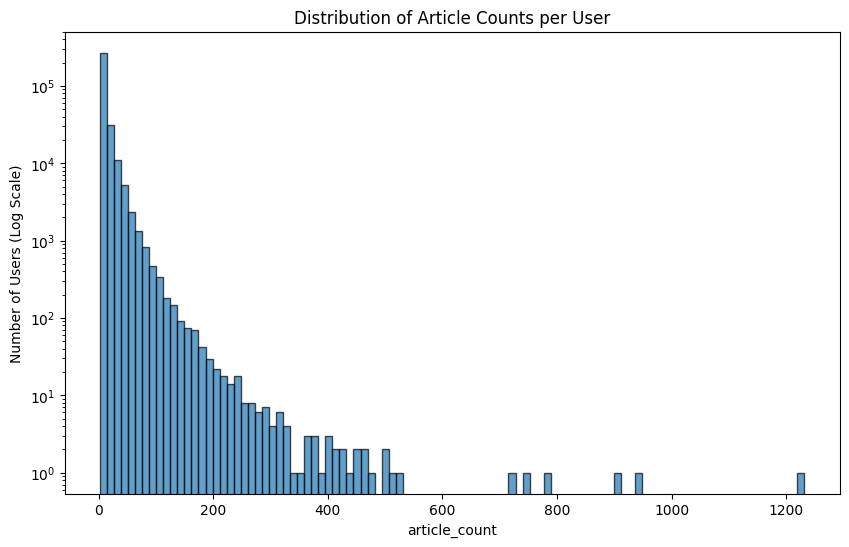

In [15]:
# Distribution of the number of articles by users
plots.article_distribution_by_users(merged_data_df, ROOT_DIR)

Users who have clicked on fewer than 100 articles will not be considered for the development of our model.

In [16]:
# Only keep users who read at least 100 articles
filtered_df = dataset.filter_by_user_counts(cf_df, 100)
filtered_df.head()

,user_id,article_id,rating
2948515,73574,160974,10.00
845019,73574,336223,8.88
1388965,9261,96210,7.57
6050,73574,234698,7.08
418897,9261,272143,6.83


In [10]:
# Create collaborative filtering model with algo kNN
best_model_knn = train.model_based_knn(filtered_df, os.path.join(ROOT_DIR, "models/model_based_knn.pickle"))

Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
RMSE: 0.2019


In [17]:
# Load the best model knn from the pickle file
with open(os.path.join(ROOT_DIR, "models/model_based_knn.pickle"), 'rb') as file:
    best_model_knn = pickle.load(file)

In [22]:
# List all articles not click by a specific user
articles_not_clicked_by_user = dataset.articles_not_clicked_by_user(filtered_df, 73574)
articles_not_clicked_by_user['article_id']

[96210,
 272143,
 331116,
 336245,
 183176,
 233717,
 129434,
 202355,
 277492,
 272660,
 133160,
 95716,
 123289,
 336380,
 235854,
 59057,
 161506,
 233658,
 293050,
 159762,
 257291,
 284985,
 199474,
 20691,
 235870,
 277491,
 31520,
 156964,
 48403,
 124177,
 338340,
 161178,
 293301,
 39894,
 128260,
 156355,
 272218,
 199197,
 123757,
 293513,
 96755,
 87224,
 336254,
 207122,
 64409,
 237822,
 63307,
 300082,
 124228,
 160940,
 288435,
 59758,
 209236,
 271262,
 338339,
 354086,
 57748,
 300470,
 141004,
 284463,
 119534,
 313504,
 235230,
 166581,
 159275,
 218028,
 337192,
 313431,
 276970,
 58619,
 288440,
 284096,
 198659,
 215861,
 236338,
 57966,
 157478,
 158906,
 175040,
 271261,
 160474,
 83534,
 284422,
 236951,
 87192,
 283505,
 202652,
 161425,
 158541,
 284583,
 235652,
 95972,
 124176,
 70215,
 160132,
 214631,
 161801,
 87228,
 96663,
 156624,
 123818,
 293062,
 206934,
 129165,
 202557,
 284844,
 157375,
 16129,
 299841,
 313920,
 237524,
 337735,
 352983,
 3639

In [23]:
prediction = best_model_knn.predict(uid=73574, iid=331116)
prediction

Prediction(uid=73574, iid=331116, r_ui=None, est=0.6156318321629102, details={'actual_k': 40, 'was_impossible': False})

In [24]:
# Make predictions
predictions = []
for article_id in articles_not_clicked_by_user['article_id']:
    prediction = best_model_knn.predict(uid=articles_not_clicked_by_user['user_id'], iid=article_id)
    predictions.append({
        'user_id': prediction.uid,
        'article_id': prediction.iid,
        'predicted_rating': prediction.est,
        'details': prediction.details
    })

# Sort the predictions in descending order by 'predicted_rating'
predictions.sort(key=lambda x: x['predicted_rating'], reverse=True)

# Display the predictions
for pred in predictions:
    print(f"User ID: {pred['user_id']}, Article ID: {pred['article_id']}, Predicted Rating: {pred['predicted_rating']}, Details: {pred['details']}")

User ID: 73574, Article ID: 95590, Predicted Rating: 9.248404726735599, Details: {'actual_k': 1, 'was_impossible': False}
User ID: 73574, Article ID: 30855, Predicted Rating: 9.241738060068933, Details: {'actual_k': 1, 'was_impossible': False}
User ID: 73574, Article ID: 233671, Predicted Rating: 9.241738060068933, Details: {'actual_k': 1, 'was_impossible': False}
User ID: 73574, Article ID: 195868, Predicted Rating: 9.241738060068933, Details: {'actual_k': 1, 'was_impossible': False}
User ID: 73574, Article ID: 32932, Predicted Rating: 9.241738060068933, Details: {'actual_k': 1, 'was_impossible': False}
User ID: 73574, Article ID: 195642, Predicted Rating: 9.241738060068933, Details: {'actual_k': 1, 'was_impossible': False}
User ID: 73574, Article ID: 308117, Predicted Rating: 9.241738060068933, Details: {'actual_k': 1, 'was_impossible': False}
User ID: 73574, Article ID: 272387, Predicted Rating: 9.241738060068933, Details: {'actual_k': 1, 'was_impossible': False}
User ID: 73574, Art